# Test Argoverse data

### Check if torch is working

In [1]:
try:
    import torch
    import torchvision
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
except:
    print(f"[INFO] torch/torchvision not available.")

torch version: 2.0.1
torchvision version: 0.15.2


In [2]:
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [3]:
!nvidia-smi

Fri Sep 22 11:27:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 520.61.05    Driver Version: 520.61.05    CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:04:00.0 Off |                    0 |
| N/A   24C    P0    24W / 250W |      0MiB / 12288MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from torch import nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.") #pip install -q torchinfo

In [5]:
import os
from pathlib import Path
print("Current folder:", os.getcwd())

Current folder: /home/015957045/DeepDataMiningLearning/DeepDataMiningLearning


In [6]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## Prepare Data

In [47]:
import os
from pathlib import Path
import pandas as pd

In [10]:
!ls /data/cmpe249-fa23/Argoverse2/sensor

test  train  val


In [12]:
!ls /data/cmpe249-fa23/Argoverse2/sensor

test  train  val


In [29]:
!ls /data/cmpe249-fa23/Argoverse2/sensor/train/00a6ffc1-6ce9-3bc3-a060-6006e9893a1a/sensors/cameras

ring_front_center  ring_rear_left   ring_side_right
ring_front_left    ring_rear_right  stereo_front_left
ring_front_right   ring_side_left   stereo_front_right


In [31]:
train_data_path = '/data/cmpe249-fa23/Argoverse2/sensor/train'
image_path_list = list(Path(image_data_path).glob("*/*/*/*/*.jpg"))
print('The total number of images: {}'.format(len(image_path_list)))

The total number of images: 157522


In [32]:
lidar_path_list = list(Path(image_data_path).glob("*/*/*/*.feather"))
print('The total number of lidar data: {}'.format(len(lidar_path_list)))

The total number of lidar data: 8459


In [23]:
!ls /data/cmpe249-fa23/Argoverse2/sensor/train/00a6ffc1-6ce9-3bc3-a060-6006e9893a1a

annotations.feather  calibration  city_SE3_egovehicle.feather  map  sensors


In [49]:
ex_label = Path('/data/cmpe249-fa23/Argoverse2/sensor/train/00a6ffc1-6ce9-3bc3-a060-6006e9893a1a/annotations.feather')

In [50]:
dataframe = pd.read_feather(ex_label, columns=None, use_threads=True, storage_options=None)
dataframe.head(10)

,timestamp_ns,track_uuid,category,length_m,width_m,height_m,qw,qx,qy,qz,tx_m,ty_m,tz_m,num_interior_pts
0,315967376859506000,136ad4d1-1a85-455a-8e33-b376ff442dd5,BOX_TRUCK,7.310948,2.902806,3.190777,0.037677,0.0,0.0,0.999290,57.492267,-8.308139,0.744452,137
1,315967376859506000,b5839925-de5a-46ac-a39d-69e58bf9589e,BUS,12.990107,2.913662,3.424075,0.997955,0.0,0.0,-0.063915,85.478591,-21.876938,0.261984,90
2,315967376859506000,bd26f1a7-a9d8-4db1-95ea-391b50781897,BUS,10.731695,2.701617,3.152368,-0.181933,0.0,0.0,0.983311,-24.379648,1.953554,1.222533,1654
3,315967376859506000,c267678b-4d1c-4638-9311-18fc666e6b50,BUS,11.251051,3.045377,3.135756,0.889129,0.0,0.0,-0.457658,-9.775378,40.850811,2.903800,638
4,315967376859506000,0914b396-21f4-4f7b-ad00-d1e4684bc18c,CONSTRUCTION_CONE,0.232600,0.537397,0.844699,-0.336139,0.0,0.0,0.941812,48.649820,42.116155,0.906673,5
5,315967376859506000,17bc0e9c-77b3-40b3-b7be-975c0959d41c,CONSTRUCTION_CONE,0.431534,0.571469,1.190200,-0.326601,0.0,0.0,0.945162,30.487792,28.899855,0.855860,11
6,315967376859506000,2bcb42b4-50b2-41f3-90ad-d8ef941dadf7,CONSTRUCTION_CONE,0.333629,0.418831,1.122611,0.988194,0.0,0.0,0.153211,-21.623711,-3.430014,0.208321,11
7,315967376859506000,8a61866c-59ea-4afd-b697-593c9d2ebda5,CONSTRUCTION_CONE,0.232600,0.580528,1.028454,-0.329953,0.0,0.0,0.943997,46.290493,40.432094,0.929474,7
8,315967376859506000,9a49c000-c8c4-4d94-bdca-f0b29a50b831,CONSTRUCTION_CONE,0.340437,0.377413,1.190200,0.978516,0.0,0.0,0.206169,-12.620739,0.261393,0.266443,32
9,315967376859506000,afe89fea-6280-405d-b737-2624c0db822b,CONSTRUCTION_CONE,0.367793,0.634004,1.151092,-0.325730,0.0,0.0,0.945463,37.163102,33.427466,0.893627,10


In [ ]:
!ls /data/cmpe249-fa23/Argoverse2/sensor/train/00a6ffc1-6ce9-3bc3-a060-6006e9893a1a/

In [5]:
# Check name of folders in train 
sensor_data_path = '/data/cmpe249-fa23/Argoverse2/sensor'
train_data_path =  '/data/cmpe249-fa23/Argoverse2/sensor/train'
label_data_path = '/data/cmpe249-fa22/Argoverse/Argoverse-1.1/labels/train'

folders_sensordata = []
folders_imagedata = []
folders_labeldata = []

for path in Path(sensor_data_path).iterdir():
    if path.is_dir():
        str_path = str(path)
        temp = str(path).split('/')
        folders_sensordata.append(temp[-1])

for path in Path(image_data_path).iterdir():
    if path.is_dir():
        str_path = str(path)
        temp = str(path).split('/')
        folders_imagedata.append(temp[-1])

for path in Path(label_data_path).iterdir():
    if path.is_dir():
        str_path = str(path)
        temp = str(path).split('/')
        folders_labeldata.append(temp[-1])
        
print(len(folders_sensordata))
print(len(folders_imagedata))
print(len(folders_labeldata))

392
65
65


As you can see, the number of folders in train directory are the same for image and label. However, the number of folders for image data does not match with that of sensor data. This shows we can't use both sensor and image data.

In [6]:
# Investigate the total number of images and labels
tot_img = 0
tot_lab = 0
for fold1, fold2 in zip(folders_imagedata, folders_labeldata):
    temp_path1 = image_data_path + '/' +  fold1 + '/ring_front_center'
    temp_path2 = image_data_path + '/' +  fold2 + '/ring_front_center'
    tot_img += len(os.listdir(temp_path1))
    tot_lab += len(os.listdir(temp_path2))
print(tot_img)
print(tot_lab)


39384
39384


In [7]:
image_path_list_val = list(Path('/data/cmpe249-fa22/Argoverse/Argoverse-1.1/images/val').glob("*/*/*.jpg"))
print('The total number of images in validation set: {}'.format(len(image_path_list_val)))

The total number of images in validation set: 15062


In [ ]:
image_path_list_val = list(Path('/data/cmpe249-fa22/Argoverse/Argoverse-1.1/images/val').glob("*/*/*.jpg"))
print('The total number of images in validation set: {}'.format(len(image_path_list_val)))

## Look at five sampled images and corresponding labels

In [75]:
from PIL import Image
import random

def read_image(seed_num):
    random.seed(seed_num)
    
    # 1. Get all image paths (* means "any combination")
    image_path_list = list(Path(image_data_path).glob("*/*/*.jpg"))
    # label_path_list = list(Path(label_data_path).glob("*/*/*.txt"))
    # print('The total number of images: {}'.format(len(image_path_list)))
    # print('The total number of labels: {}'.format(len(label_path_list)))
    
    # 2. Get a random image path
    random_image_path = random.choice(image_path_list)
    list_random_label_path = str(random_image_path).split('/')
    list_random_label_path[5] = 'labels'
    rename = list_random_label_path[-1].split('.')
    rename[-1] = 'txt'
    list_random_label_path[-1] = '.'.join(rename)
    random_label_path = Path('/'.join(list_random_label_path))
    
    # 3. Get image class from path name (the image class is the name of the directory where the image is stored)
    label_file = open(str(random_label_path), 'r')
    print(label_file.read())
    
    # reference: https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/datasets/Argoverse.yaml
    # according to the reference, classes are:
    class_dic = {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'bus', 5: 'truck', 6: 'traffic_light', 7: 'stop_sign'}
    
    # 4. Open image
    img = Image.open(random_image_path)
    
    # 4. Print metadata
    print(f"Random image path: {random_image_path}")
    print(f"Image height: {img.height}") 
    print(f"Image width: {img.width}")
    display(img)
    
    

4 0.8929315476190476 0.48309523809523813 0.21413690476190486 0.43261904761904757
2 0.6092013888888889 0.5647222222222222 0.25173611111111105 0.16444444444444448
5 0.12161458333333333 0.56375 0.1828125 0.15083333333333335
6 0.13807291666666668 0.23583333333333334 0.01822916666666668 0.08333333333333333
6 0.2943181818181818 0.24117424242424246 0.016666666666666666 0.07856060606060607
6 0.42265625 0.42083333333333334 0.009895833333333333 0.028333333333333332
6 0.4503348214285714 0.41684523809523816 0.018229166666666668 0.02583333333333338
6 0.6090625000000001 0.06008333333333334 0.03270833333333331 0.12016666666666669
2 0.31276041666666665 0.51875 0.0171875 0.019166666666666665
2 0.2752864583333333 0.5165416666666666 0.01661458333333338 0.015083333333333258
2 0.7407552083333333 0.53 0.048177083333333336 0.0475
2 0.7671701388888892 0.5202777777777777 0.033715277777777906 0.04544444444444442
0 0.7864583333333334 0.5366666666666666 0.013541666666666667 0.09333333333333334

Random image path:

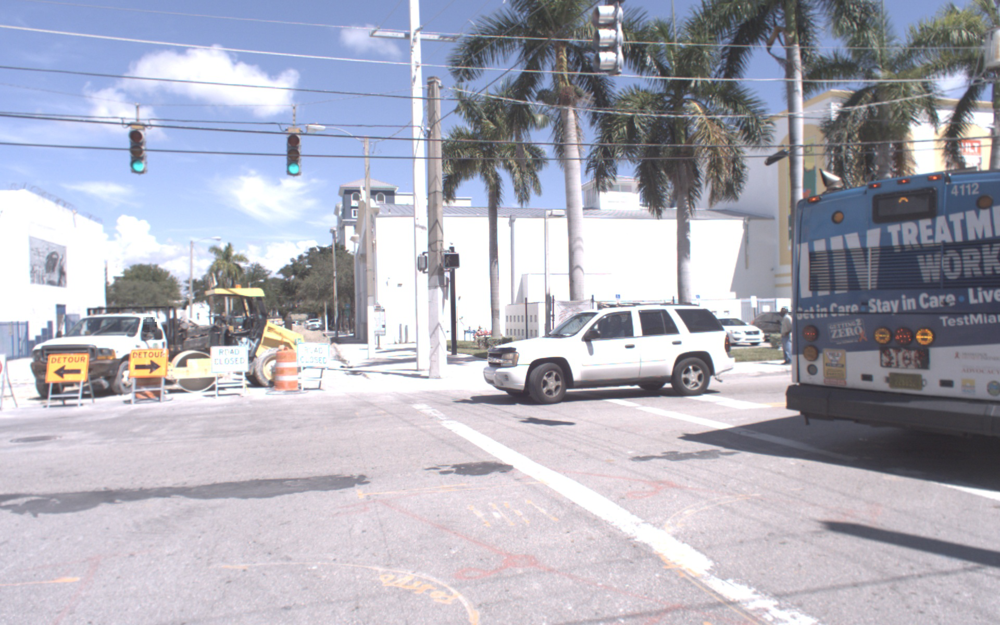

In [76]:
read_image(123)

2 0.86484375 0.7075 0.2703125 0.585
2 0.175 0.6316666666666667 0.19583333333333333 0.17666666666666667
5 0.46770833333333334 0.5241666666666667 0.027083333333333334 0.051666666666666666
2 0.5572916666666666 0.5370833333333334 0.022916666666666665 0.029166666666666667
2 0.29401041666666666 0.6016666666666667 0.0734375 0.10166666666666667
2 0.65625 0.58 0.11875 0.14833333333333334
2 0.3489583333333333 0.5679166666666666 0.06770833333333333 0.0925
2 0.5935156250000001 0.5622083333333334 0.038906250000000024 0.09341666666666669
2 0.390546875 0.5682916666666668 0.020572916666666666 0.05775000000000006
2 0.5908854166666667 0.5532916666666667 0.041874999999999926 0.07758333333333335
2 0.57109375 0.5475 0.005729166666666666 0.016666666666666666
2 0.5490885416666667 0.5276666666666667 0.015885416666666666 0.02633333333333335
2 0.5529947916666667 0.5310833333333332 0.01921874999999993 0.026500000000000058
2 0.5070572916666667 0.5225 0.029218750000000012 0.015833333333333335
2 0.4456770833333333 

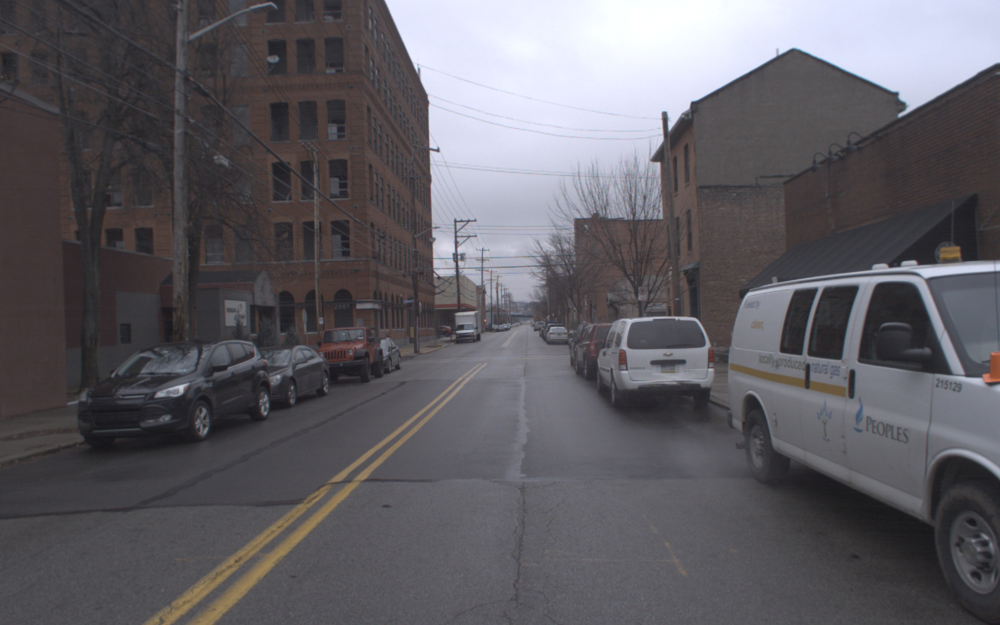

In [77]:
read_image(42)

2 0.5440104166666667 0.5191666666666667 0.0234375 0.035
5 0.434375 0.5258333333333334 0.058333333333333334 0.08
5 0.3455729166666667 0.5108333333333334 0.0921875 0.06666666666666667
2 0.30859375 0.5279166666666667 0.07239583333333334 0.0375
2 0.5072916666666667 0.5120833333333333 0.010416666666666666 0.016666666666666666
2 0.07317708333333334 0.5591666666666667 0.1046875 0.07
2 0.03697916666666667 0.5583333333333333 0.07395833333333333 0.09166666666666666
5 0.534375 0.5095833333333334 0.029166666666666667 0.0475
2 0.48541666666666666 0.51 0.021875 0.016666666666666666
2 0.5169270833333334 0.50875 0.011979166666666667 0.0125
2 0.47161458333333334 0.5133333333333333 0.0109375 0.016666666666666666
2 0.4669270833333333 0.5170833333333333 0.009895833333333333 0.0175
2 0.4622395833333333 0.5220833333333333 0.0036458333333333334 0.019166666666666665

Random image path: /data/cmpe249-fa22/Argoverse/Argoverse-1.1/images/train/dcdcd8b3-0ba1-3218-b2ea-7bb965aad3f0/ring_front_center/ring_front_cen

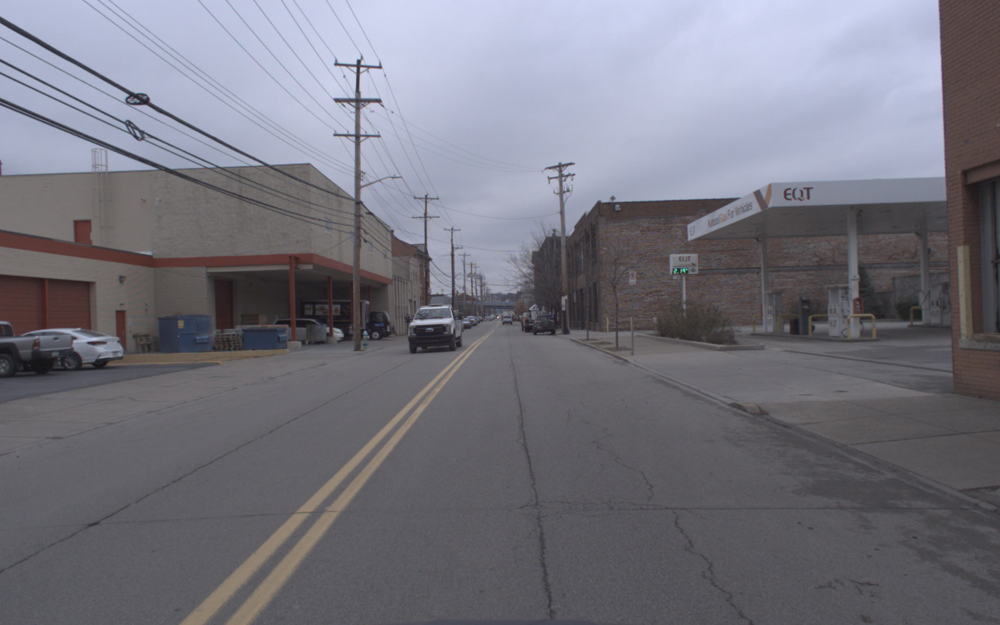

In [78]:
read_image(9)

2 0.4986979166666667 0.59 0.1171875 0.13
2 0.8885416666666667 0.6554166666666666 0.0625 0.11083333333333334
2 0.7630208333333334 0.60375 0.178125 0.2125
0 0.7674479166666667 0.6241666666666666 0.06510416666666667 0.27
2 0.67734375 0.5620833333333334 0.1015625 0.1325
2 0.6286458333333333 0.5366666666666666 0.078125 0.10166666666666667
2 0.5098958333333333 0.5083333333333333 0.036458333333333336 0.02666666666666667
3 0.5729166666666666 0.5320833333333334 0.029166666666666667 0.0425
2 0.5635416666666667 0.5225 0.020833333333333332 0.041666666666666664
2 0.59296875 0.5304166666666666 0.0234375 0.060833333333333336
2 0.5596354166666667 0.5175 0.025520833333333333 0.03666666666666667
2 0.25286458333333334 0.5770833333333333 0.12864583333333332 0.12416666666666666
0 0.8299479166666667 0.6370833333333333 0.0578125 0.2525
0 0.8635416666666667 0.6458333333333334 0.057291666666666664 0.2916666666666667
0 0.018489583333333334 0.71 0.03697916666666667 0.295
1 0.029166666666666667 0.7929166666666667

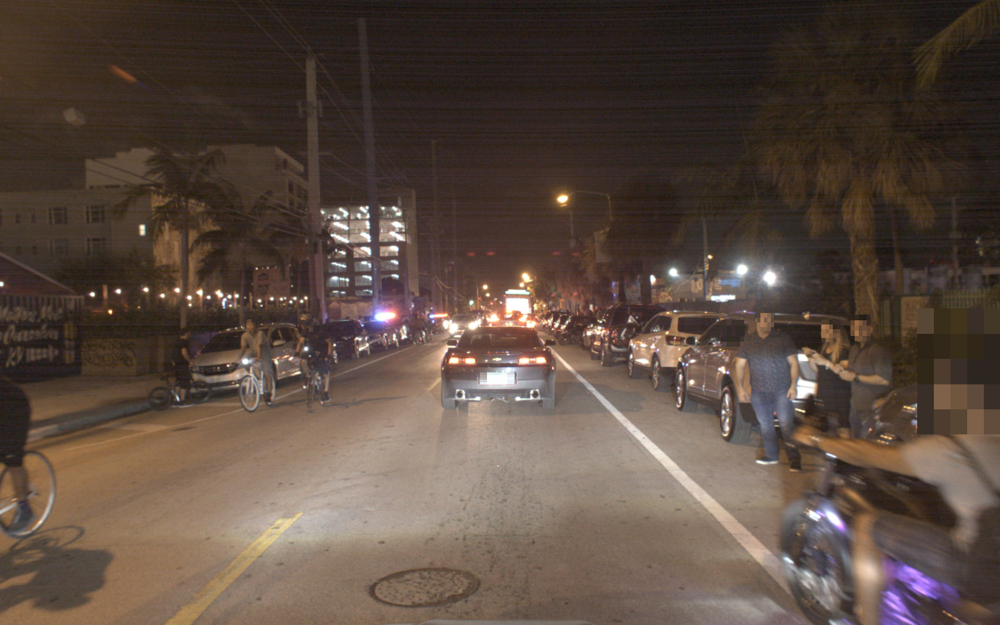

In [79]:
read_image(915)

2 0.13671875 0.5375 0.09739583333333333 0.058333333333333334
2 0.36209490740740746 0.5175462962962963 0.028472222222222263 0.025833333333333333
2 0.4251302083333333 0.5079166666666667 0.01484375 0.015
6 0.5065972222222223 0.44819444444444445 0.007291666666666667 0.005833333333333334
2 0.15247395833333333 0.5097916666666666 0.029427083333333333 0.015416666666666667
0 0.21145833333333333 0.5254166666666666 0.011458333333333333 0.049166666666666664
2 0.31223958333333335 0.5046666666666666 0.010520833333333297 0.013666666666666648
2 0.2861328125 0.5022395833333333 0.014192708333333333 0.0153125
2 0.5222395833333333 0.5119166666666666 0.010104166666666714 0.03450000000000008
2 0.4507378472222222 0.5093055555555556 0.013975694444444405 0.014166666666666666
2 0.12046874999999999 0.50775 0.024062499999999994 0.02183333333333337
5 0.08598958333333333 0.5085000000000001 0.03802083333333333 0.03300000000000002
6 0.3444444444444444 0.43513888888888896 0.00625 0.004166666666666667
5 0.4866319444444

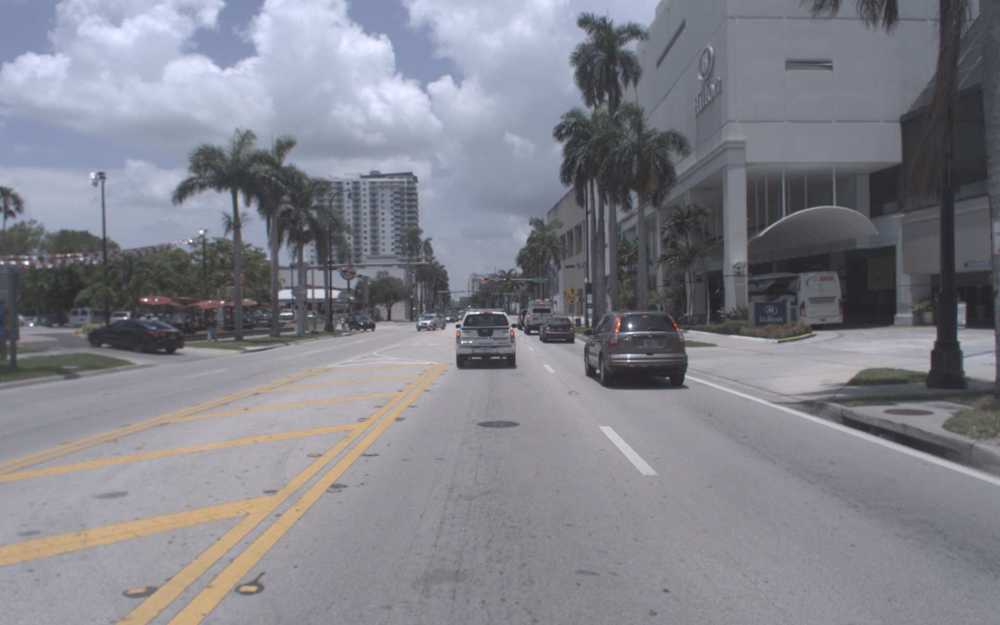

In [80]:
read_image(77)